# BiSeNet v2 구현  
- pytorch

In [1]:
import os
import time
import random
import warnings
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob
from tqdm.notebook import tqdm

import torch
import torch.utils.model_zoo as modelzoo
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary
import albumentations as A

from torchcallback import EarlyStopping, CheckPoint
from torchlosses import OhemCELoss
from torchmetrics import Metrics
from torchscheduler import PolynomialLRDecay

In [2]:
warnings.filterwarnings('ignore')
%matplotlib inline
plt.rcParams['figure.figsize'] = [10,7]

# Load Data

In [3]:
# 클래스 디렉토리 데이터 불러오기
data = pd.read_csv(r'C:\Users\user\MY_DL\segmentation\dataset\CamVid_high\class_dict.csv', index_col=0)

rgb_data = {name:list(data.loc[name, :][:3]) for name in data.index}
rgb_array = {idx:np.array(rgb) for idx, (_, rgb) in enumerate(rgb_data.items())}

data

,r,g,b,class_11
name,,,,
Animal,64,128,64,0
Archway,192,0,128,0
Bicyclist,0,128,192,1
Bridge,0,128,64,0
Building,128,0,0,1
Car,64,0,128,1
CartLuggagePram,64,0,192,0
Child,192,128,64,0
Column_Pole,192,192,128,1


In [4]:
width = 480
height = 360
num_classes = len(data)

# cuda setting
device = torch.device('cuda')
print(device)

cuda


In [5]:
def load_image(path, subset='train'):
    image_list, label_list = [], []
    image_files = glob(path+subset+'/'+subset+'_images/*.png')
    label_files = glob(path+subset+'/'+subset+'_labels/*.png')
    for file in tqdm(image_files):
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        image_list.append(img)
    for file in tqdm(label_files):
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        label_list.append(img)
    return np.array(image_list), np.array(label_list)

path = 'C:/Users/user/MY_DL/segmentation/dataset/camvid_high/'
train_image, train_label = load_image(path, subset='train')
valid_image, valid_label = load_image(path, subset='valid')
test_image, test_label = load_image(path, subset='test')

  0%|          | 0/367 [00:00<?, ?it/s]

  0%|          | 0/367 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/233 [00:00<?, ?it/s]

  0%|          | 0/233 [00:00<?, ?it/s]

In [6]:
def rgb2mask(labels):
    semantic_map = []
    for color in tqdm(list(rgb_data.values())):
        equality = np.equal(labels, color)
        class_map = np.all(equality, axis=-1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)
    return np.float32(semantic_map)

train_mask = rgb2mask(train_label)
valid_mask = rgb2mask(valid_label)
test_mask = rgb2mask(test_label)

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

In [7]:
class CamVidDataset(Dataset):
    def __init__(self, transforms_=None, subset='train'):
        assert subset in ('train', 'valid', 'test')
        self.totensor = transforms.Compose([transforms.ToTensor()])
        self.transforms_ = transforms_
        self.subset = subset
        
        if self.subset=='train':
            self.images = train_image
            self.labels = train_mask
        elif self.subset=='valid':
            self.images = valid_image
            self.labels = valid_mask
        else:
            self.images = test_image
            self.labels = test_mask
            
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        images = self.images[idx]
        labels = self.labels[idx]
        if self.transforms_ is not None:
            augmented = self.transforms_(image=images, mask=labels)
            images = augmented['image']
            labels = augmented['mask']
        return self.totensor(images), self.totensor(labels)

In [8]:
batch_size = 16

train_augment = A.Compose([
    A.HorizontalFlip(),
    A.ColorJitter(),
    A.RandomResizedCrop(
        height=height, 
        width=width, 
        scale=(0.75, 2.0),
        interpolation=cv2.INTER_NEAREST,
    )
])

valid_augment = A.Compose([
    A.Resize(height=height, width=width),
])

train_loader = DataLoader(
    CamVidDataset(transforms_=train_augment, subset='train'),
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)

valid_loader = DataLoader(
    CamVidDataset(transforms_=valid_augment, subset='valid'),
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)

## Build Model

In [9]:
# common block : conv + batch normalization + relu
class ConvBlock(nn.Module):
    def __init__(self, 
                 in_dim, 
                 out_dim, 
                 kernel_size=3, 
                 stride=1,
                 padding=1,
                 dilation=1,
                 groups=1,
                 bias=False):
        
        super(ConvBlock, self).__init__()
        self.conv = nn.Conv2d(
            in_dim, out_dim,
            kernel_size=kernel_size,
            stride=stride,
            padding=padding,
            dilation=dilation,
            groups=groups,
            bias=bias,
        )
        self.bn = nn.BatchNorm2d(out_dim)
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.relu(x)
        return x

In [10]:
# Detail Branch
class DetailBranch(nn.Module):
    def __init__(self, in_dim=3, num_filters=64):
        super(DetailBranch, self).__init__()
        self.S1 = nn.Sequential(
            ConvBlock(in_dim, num_filters, stride=2),
            ConvBlock(num_filters, num_filters, stride=1),
        )
        self.S2 = nn.Sequential(
            ConvBlock(num_filters, num_filters, stride=2),
            ConvBlock(num_filters, num_filters, stride=1),
            ConvBlock(num_filters, num_filters, stride=1),
        )
        self.S3 = nn.Sequential(
            ConvBlock(num_filters, num_filters*2, stride=2),
            ConvBlock(num_filters*2, num_filters*2, stride=1),
            ConvBlock(num_filters*2, num_filters*2, stride=1),
        )
        
    def forward(self, x):
        x = self.S1(x)
        x = self.S2(x)
        x = self.S3(x)
        return x

In [11]:
# Stem Block
class StemBlock(nn.Module):
    def __init__(self, in_dim=3, num_filters=16):
        super(StemBlock, self).__init__()
        self.conv_head = ConvBlock(in_dim, num_filters, kernel_size=3, stride=2, padding=1)
        self.left_block = nn.Sequential(
            ConvBlock(num_filters, num_filters//2, kernel_size=1, stride=1, padding=0),
            ConvBlock(num_filters//2, num_filters, kernel_size=3, stride=2, padding=1),
        )
        self.right_block = nn.MaxPool2d(kernel_size=3, stride=2, padding=1, ceil_mode=False)
        self.conv_tail = ConvBlock(num_filters*2, num_filters, kernel_size=3, stride=1, padding=1)
        
    def forward(self, x):
        x = self.conv_head(x)
        x_left = self.left_block(x)
        x_right = self.right_block(x)
        x = torch.cat((x_left, x_right), dim=1)
        x = self.conv_tail(x)
        return x

In [12]:
# Context Embedding Block
class CEBlock(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(CEBlock, self).__init__()
        self.gap = nn.AdaptiveAvgPool2d(output_size=(1,1))
        self.bn = nn.BatchNorm2d(in_dim, eps=1e-8)
        self.gap_conv = ConvBlock(in_dim, out_dim, kernel_size=1, stride=1, padding=0)
        self.out_conv = ConvBlock(out_dim, out_dim, 
                                  kernel_size=3, stride=1, padding=1)
        
    def forward(self, inputs):
        x = self.gap(inputs)
        x = self.bn(x)
        x = self.gap_conv(x)
        x = torch.add(inputs, x)
        x = self.out_conv(x)
        return x

In [13]:
# Gather-and-Expansion Layer 1
class GELayer1(nn.Module):
    def __init__(self, in_dim, out_dim, ratio=6):
        super(GELayer1, self).__init__()
        expansion_dim = in_dim * ratio
        self.conv1 = ConvBlock(in_dim, in_dim, kernel_size=3, stride=1)
        self.dwconv = nn.Sequential(
            nn.Conv2d(in_dim, expansion_dim, 
                      kernel_size=3, stride=1, padding=1,
                      groups=in_dim, bias=False),
            nn.BatchNorm2d(expansion_dim),
            nn.ReLU(inplace=True),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(expansion_dim, out_dim, 
                      kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(out_dim),
        )
        self.conv2[1].last_bn = True
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, inputs):
        x = self.conv1(inputs)
        x = self.dwconv(x)
        x = self.conv2(x)
        x = torch.add(inputs, x)
        x = self.relu(x)
        return x

In [14]:
# Gather-and-Expansion Layer 2
class GELayer2(nn.Module):
    def __init__(self, in_dim, out_dim, ratio=6):
        super(GELayer2, self).__init__()
        expansion_dim = in_dim * ratio
        # left block
        self.left_conv1 = ConvBlock(in_dim, in_dim, kernel_size=3, stride=1, padding=1)
        self.left_dwconv1 = nn.Sequential(
            nn.Conv2d(in_dim, expansion_dim,
                      kernel_size=3, stride=2, padding=1,
                      groups=in_dim, bias=False),
            nn.BatchNorm2d(expansion_dim),
        )
        self.left_dwconv2 = nn.Sequential(
            nn.Conv2d(expansion_dim, expansion_dim, 
                      kernel_size=3, stride=1, padding=1,
                      groups=expansion_dim, bias=False),
            nn.BatchNorm2d(expansion_dim),
            nn.ReLU(inplace=True),
        )
        self.left_conv2 = nn.Sequential(
            nn.Conv2d(expansion_dim, out_dim, 
                      kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(out_dim),
        )
        self.left_conv2[1].last_bn = True
        # right block
        self.right_dwconv1 = nn.Sequential(
            nn.Conv2d(in_dim, in_dim,
                      kernel_size=3, stride=2, padding=1,
                      groups=in_dim, bias=False),
            nn.BatchNorm2d(in_dim),
        )
        self.right_conv1 = nn.Sequential(
            nn.Conv2d(in_dim, out_dim, 
                      kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(out_dim),
        )
        # last relu activation layer
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, inputs):
        # left block operation
        left_x = self.left_conv1(inputs)
        left_x = self.left_dwconv1(left_x)
        left_x = self.left_dwconv2(left_x)
        left_x = self.left_conv2(left_x)
        # right block operation
        right_x = self.right_dwconv1(inputs)
        right_x = self.right_conv1(right_x)
        # output operation
        sum_x = torch.add(left_x, right_x)
        out = self.relu(sum_x)
        return out

In [15]:
# Semantic Branch
class SemanticBranch(nn.Module):
    def __init__(self, num_filters=16):
        super(SemanticBranch, self).__init__()
        # stage 1 and stage 2
        self.stage1_2 = StemBlock()
        # stage 3
        self.stage3 = nn.Sequential(
            GELayer2(num_filters, num_filters*2),
            GELayer1(num_filters*2, num_filters*2),
        )
        # stage 4
        self.stage4 = nn.Sequential(
            GELayer2(num_filters*2, num_filters*4),
            GELayer1(num_filters*4, num_filters*4),
        )
        # stage 5
        self.stage5 = nn.Sequential(
            GELayer2(num_filters*4, num_filters*8),
            GELayer1(num_filters*8, num_filters*8),
            GELayer1(num_filters*8, num_filters*8),
            GELayer1(num_filters*8, num_filters*8),
        )
        # last : Context Embedding
        self.ce = CEBlock(num_filters*8, num_filters*8)
        
    def forward(self, x):
        s2 = self.stage1_2(x)
        s3 = self.stage3(s2)
        s4 = self.stage4(s3)
        s5 = self.stage5(s4)
        out = self.ce(s5)
        return s2, s3, s4, s5, out

In [16]:
class BGALayer(nn.Module):
    def __init__(self, db_output_size, in_dim=128):
        super(BGALayer, self).__init__()
        # This block receives output of detail branch
        self.detail_branch_keep = nn.Sequential(
            nn.Conv2d(in_dim, in_dim, 
                      kernel_size=3, stride=1, padding=1,
                      groups=in_dim, bias=False),
            nn.BatchNorm2d(in_dim),
            nn.Conv2d(in_dim, in_dim, 
                      kernel_size=1, stride=1, padding=0, bias=False),
        )
        self.detail_branch_down = nn.Sequential(
            nn.Conv2d(in_dim, in_dim, 
                      kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(in_dim),
            nn.AvgPool2d(kernel_size=3, stride=2, padding=1, ceil_mode=False),
        )
        # This block receives output of semantic branch
        self.semantic_branch_up = nn.Sequential(
            nn.Conv2d(in_dim, in_dim, 
                      kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(in_dim),
            nn.Upsample(size=db_output_size),
            nn.Sigmoid(),
        )
        self.semantic_branch_keep = nn.Sequential(
            nn.Conv2d(in_dim, in_dim,
                      kernel_size=3, stride=1, padding=1,
                      groups=in_dim, bias=False),
            nn.BatchNorm2d(in_dim),
            nn.Conv2d(in_dim, in_dim, 
                      kernel_size=1, stride=1, padding=0, bias=False),
            nn.Sigmoid(),
        )
        # up-sample detail branch down + semantic branch keep
        self.upsample = nn.Upsample(size=db_output_size)
        # last layer: conv
        self.last_conv = nn.Sequential(
            nn.Conv2d(in_dim, in_dim, 
                      kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(in_dim),
            nn.ReLU(inplace=True),
        )
    
    def forward(self, detail_output, semantic_output):
        # receive output of detail branch
        detail_keep = self.detail_branch_keep(detail_output)
        detail_down = self.detail_branch_down(detail_output)
        # receive output of semantic branch
        semantic_up = self.semantic_branch_up(semantic_output)
        semantic_keep = self.semantic_branch_keep(semantic_output)
        # detail keep + semantic up
        left = torch.mul(detail_keep, semantic_up)
        # detail down + semantic keep
        right = torch.mul(detail_down, semantic_keep)
        right = self.upsample(right)
        # left + right
        last_sum = torch.add(left, right)
        # output
        out = self.last_conv(last_sum)
        
        return out

In [17]:
# Seg Head in booster
class SegHead(nn.Module):
    def __init__(self, in_dim, mid_dim, out_dim, size, aux=True):
        mid_dim2 = mid_dim//2 if aux else mid_dim
        height, width = size
        super(SegHead, self).__init__()
        self.convblock = ConvBlock(in_dim, mid_dim, kernel_size=3, stride=1, padding=1)
        self.drop = nn.Dropout(0.1)
        
        self.conv_out = nn.Sequential(
            nn.Sequential(
                nn.Upsample(size=(height//2, width//2)),
                ConvBlock(mid_dim, mid_dim2, kernel_size=3, stride=1, padding=1),
            ) if aux else nn.Identity(),
            nn.Conv2d(mid_dim2, out_dim, 
                      kernel_size=1, stride=1, padding=0, bias=True),
            nn.Upsample(size=size, mode='bilinear', align_corners=False),
        )
        
    def forward(self, x):
        x = self.convblock(x)
        x = self.drop(x)
        x = self.conv_out(x)
        return x

In [18]:
# define final model
backbone_url = 'https://github.com/CoinCheung/BiSeNet/releases/download/0.0.0/backbone_v2.pth'

class BiSeNetV2(nn.Module):
    def __init__(self, input_size, bga_size, phase='train'):
        super(BiSeNetV2, self).__init__()
        assert phase in ('train', 'test')
        # load each branches and layer
        self.phase = phase
        self.detail = DetailBranch()
        self.semantic = SemanticBranch()
        self.aggregation = BGALayer(db_output_size=bga_size)
        """
        If the model is in the training phase, use booster training to calculate losses.
        If not, do not use booster training. (eg. test the model)
        """
        
        self.out_head = SegHead(128, 1024, num_classes, size=input_size, aux=False)
        
        if self.phase=='train':
            self.s2_head = SegHead(16, 128, num_classes, size=input_size)
            self.s3_head = SegHead(32, 128, num_classes, size=input_size)
            self.s4_head = SegHead(64, 128, num_classes, size=input_size)
            self.s5_head = SegHead(128, 128, num_classes, size=input_size)
            
        # initialize weights
        self._init_weights_()
        
    def forward(self, inputs):
        detail_out = self.detail(inputs)
        s2, s3, s4, s5, semantic_out = self.semantic(inputs)
        out = self.aggregation(detail_out, semantic_out)
        
        if self.phase=='train':
            # up-sampling for seg head output
            s2 = self.s2_head(s2)
            s3 = self.s3_head(s3)
            s4 = self.s4_head(s4)
            s5 = self.s5_head(s5)
            out = self.out_head(out)
            return out, s2, s3, s4, s5
        
        else:
            out = self.out_head(out)
            return out
        
    def _init_weights_(self):
        for name, module in self.named_modules():
            if isinstance(module, (nn.Conv2d, nn.Linear)):
                nn.init.kaiming_normal_(module.weight, mode='fan_out')
                if not module.bias is None: nn.init.constant_(module.bias, 0)
            elif isinstance(module, nn.modules.batchnorm._BatchNorm):
                if hasattr(module, 'last_bn') and module.last_bn:
                    nn.init.zeros_(module.weight)
                else:
                    nn.init.ones_(module.weight)
                nn.init.zeros_(module.bias)
        self._load_pretrained_weight_()
                
    def _load_pretrained_weight_(self):
        state = modelzoo.load_url(backbone_url)
        for name, child in self.named_children():
            if name in state.keys():
                child.load_state_dict(state[name], strict=True)

In [19]:
summary(BiSeNetV2(input_size=(height,width), bga_size=(height//8,width//8)), 
        (3,height,width),
        device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 180, 240]           1,728
       BatchNorm2d-2         [-1, 64, 180, 240]             128
              ReLU-3         [-1, 64, 180, 240]               0
         ConvBlock-4         [-1, 64, 180, 240]               0
            Conv2d-5         [-1, 64, 180, 240]          36,864
       BatchNorm2d-6         [-1, 64, 180, 240]             128
              ReLU-7         [-1, 64, 180, 240]               0
         ConvBlock-8         [-1, 64, 180, 240]               0
            Conv2d-9          [-1, 64, 90, 120]          36,864
      BatchNorm2d-10          [-1, 64, 90, 120]             128
             ReLU-11          [-1, 64, 90, 120]               0
        ConvBlock-12          [-1, 64, 90, 120]               0
           Conv2d-13          [-1, 64, 90, 120]          36,864
      BatchNorm2d-14          [-1, 64, 

# Set optimizer, loss function

In [20]:
model = BiSeNetV2(input_size=(height,width), bga_size=(height//8,width//8), phase='train').to(device)
lr = 1e-3
es_save_path = './model/es_checkpoint.pt'
cp_save_path = './model/cp_checkpoint.pt'
loss_func = nn.CrossEntropyLoss().to(device)
#loss_func = OhemCELoss(thresh=0.7).to(device)
optimizer = optim.SGD(model.parameters(), lr=5e-2, momentum=0.9, weight_decay=5e-4)
# optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)
lr_scheduler = PolynomialLRDecay(optimizer, max_decay_steps=800)
metric = Metrics(n_classes=num_classes, dim=1)
checkpoint = CheckPoint(verbose=True, path=cp_save_path)
early_stopping = EarlyStopping(patience=300, verbose=True, path=es_save_path)

In [21]:
def train(model,
          train_data,
          validation_data,
          epochs,
          loss_alpha=1,
          learning_rate_scheduler=False,
          check_point=False,
          early_stop=False,
          last_epoch_save_path='./model/last_checkpoint.pt'):
    # create empty list to append losses and mious of train, validation
    loss_list, miou_list = [], []
    val_loss_list, val_miou_list = [], []
    ############################# training #############################
    # train the model
    
    starting = time.time()
    print('Start Training the Model!')
    # start training
    for epoch in tqdm(range(epochs)):
        init_time = time.time()
        # train by batch
        batch_loss, batch_miou = 0, 0
        for batch, (train_images, train_labels) in enumerate(train_data):
            train_images, train_labels = train_images.to(device), train_labels.to(device)
            model.train()
            # patch wise learning
#            train_images, train_labels = patch_wise_learning(train_images, train_labels)
            # initialize the gradient to 0
            optimizer.zero_grad()
            
            output_images, s2, s3, s4, s5 = model(train_images)
            
            p_loss = loss_func(output_images, train_labels)
            a_loss1 = loss_func(s2, train_labels)
            a_loss2 = loss_func(s3, train_labels)
            a_loss3 = loss_func(s4, train_labels)
            a_loss4 = loss_func(s5, train_labels)
            
            # calculate loss and mean IoU
            loss = p_loss + loss_alpha*(a_loss1+a_loss2+a_loss3+a_loss4)
            batch_loss += loss.item()
            miou = metric.mean_iou(output_images, train_labels)
            batch_miou += miou.item()
            
            # update loss and optimizer
            loss.backward()
            optimizer.step()
            
            # delete memory of gpu
            del train_images; del train_labels
            del s2; del s3; del s4; del s5
            torch.cuda.empty_cache()
            
        loss_list.append(batch_loss/(batch+1))
        miou_list.append(batch_miou/(batch+1))
        
        ############################# validate #############################
        # validate the model
        model.eval()
        with torch.no_grad():
            vbatch_loss, vbatch_miou = 0, 0
            for vbatch, (val_images, val_labels) in enumerate(validation_data):
                val_images, val_labels = val_images.to(device), val_labels.to(device)
#                val_images, val_labels = patch_wise_learning(val_images, val_labels)
                
                val_outputs, v_s2, v_s3, v_s4, v_s5 = model(val_images)
                
                p_val_loss = loss_func(val_outputs, val_labels)
                a_val_loss1 = loss_func(v_s2, val_labels)
                a_val_loss2 = loss_func(v_s3, val_labels)
                a_val_loss3 = loss_func(v_s4, val_labels)
                a_val_loss4 = loss_func(v_s5, val_labels)
                
                # calculate valid loss and miou
                val_loss = p_val_loss + loss_alpha*(a_val_loss1+a_val_loss2+a_val_loss3+a_val_loss4)
                vbatch_loss += val_loss.item()
                val_miou = metric.mean_iou(val_outputs, val_labels)
                vbatch_miou += val_miou.item()
                    
                del val_images; del val_labels
                del v_s2; del v_s3; del v_s4; del v_s5
                torch.cuda.empty_cache()
                    
            val_loss_list.append(vbatch_loss/(vbatch+1))
            val_miou_list.append(vbatch_miou/(vbatch+1))
        
        end_time = time.time()
        # check epoch, loss, miou and time of training
        print(f'\n[Epoch {epoch+1}/{epochs}]'
              f'  [time: {end_time-init_time:.3f}s]'
              f'  [lr = {optimizer.param_groups[0]["lr"]}]')
        print(f'[train loss: {batch_loss/(batch+1):.3f}]'
              f'  [train mIoU: {batch_miou/(batch+1):.3f}]'
              f'  [valid loss: {vbatch_loss/(vbatch+1):.3f}]'
              f'  [valid mIoU: {vbatch_miou/(vbatch+1):.3f}]')
            
        if learning_rate_scheduler: 
            lr_scheduler.step(epoch+1)
            
        # save model check point
        if check_point:
            checkpoint(vbatch_loss/(vbatch+1), model)
            
        # set early stopping
        if early_stop:
            assert check_point==False
            early_stopping(vbatch_loss/(vbatch+1), model)
            if early_stopping.early_stop:
                print('\n##########################\n'
                      '##### Early Stopping #####\n'
                      '##########################')
                break
                
    # if we not set early stopping, the model save at the end of training
    if early_stop==False and check_point==False:
        torch.save(model.state_dict(), last_epoch_save_path)
        print('Saving model of last epoch')
        
    ending = time.time()
    print(f'\n Total time for training is {ending-starting:.3f}s')
    
    return model, loss_list, miou_list, val_loss_list, val_miou_list

In [22]:
EPOCH = 800

model, train_loss, train_miou, valid_loss, valid_miou = train(
    model,
    train_data=train_loader,
    validation_data=valid_loader,
    epochs=EPOCH,
    learning_rate_scheduler=True,
    check_point=True,
    early_stop=False,
)

Start Training the Model!


  0%|          | 0/800 [00:00<?, ?it/s]


[Epoch 1/800]  [time: 61.139s]  [lr = 0.049943757733466064]
[train loss: 12.169]  [train mIoU: 0.101]  [valid loss: 12.147]  [valid mIoU: 0.122]
Validation loss decreased (inf --> 12.147).  Saving model ...

[Epoch 2/800]  [time: 56.588s]  [lr = 0.049943757733466064]
[train loss: 6.296]  [train mIoU: 0.133]  [valid loss: 6.875]  [valid mIoU: 0.168]
Validation loss decreased (12.147 --> 6.875).  Saving model ...

[Epoch 3/800]  [time: 56.672s]  [lr = 0.049887508427407516]
[train loss: 5.579]  [train mIoU: 0.160]  [valid loss: 6.886]  [valid mIoU: 0.182]

[Epoch 4/800]  [time: 56.468s]  [lr = 0.049831252072120136]
[train loss: 5.222]  [train mIoU: 0.179]  [valid loss: 5.799]  [valid mIoU: 0.192]
Validation loss decreased (6.875 --> 5.799).  Saving model ...

[Epoch 5/800]  [time: 58.682s]  [lr = 0.049774988657874136]
[train loss: 4.959]  [train mIoU: 0.190]  [valid loss: 6.471]  [valid mIoU: 0.198]

[Epoch 6/800]  [time: 56.808s]  [lr = 0.049718718174914064]
[train loss: 4.730]  [train 


[Epoch 52/800]  [time: 57.404s]  [lr = 0.047122460288729746]
[train loss: 2.761]  [train mIoU: 0.489]  [valid loss: 2.803]  [valid mIoU: 0.396]
Validation loss decreased (2.848 --> 2.803).  Saving model ...

[Epoch 53/800]  [time: 56.588s]  [lr = 0.04706584607488712]
[train loss: 2.783]  [train mIoU: 0.501]  [valid loss: 2.866]  [valid mIoU: 0.374]

[Epoch 54/800]  [time: 56.194s]  [lr = 0.04700922429179099]
[train loss: 2.797]  [train mIoU: 0.508]  [valid loss: 2.820]  [valid mIoU: 0.408]

[Epoch 55/800]  [time: 56.648s]  [lr = 0.04695259492829447]
[train loss: 2.791]  [train mIoU: 0.501]  [valid loss: 3.028]  [valid mIoU: 0.412]

[Epoch 56/800]  [time: 56.573s]  [lr = 0.04689595797321926]
[train loss: 2.780]  [train mIoU: 0.507]  [valid loss: 3.043]  [valid mIoU: 0.408]

[Epoch 57/800]  [time: 56.434s]  [lr = 0.04683931341535556]
[train loss: 2.754]  [train mIoU: 0.507]  [valid loss: 3.087]  [valid mIoU: 0.409]

[Epoch 58/800]  [time: 56.163s]  [lr = 0.046782661243461934]
[train los


[Epoch 107/800]  [time: 57.497s]  [lr = 0.04399713456800545]
[train loss: 2.382]  [train mIoU: 0.586]  [valid loss: 2.442]  [valid mIoU: 0.441]
Validation loss decreased (2.467 --> 2.442).  Saving model ...

[Epoch 108/800]  [time: 56.435s]  [lr = 0.04394008662159191]
[train loss: 2.375]  [train mIoU: 0.585]  [valid loss: 2.772]  [valid mIoU: 0.442]

[Epoch 109/800]  [time: 56.753s]  [lr = 0.04388303044255452]
[train loss: 2.384]  [train mIoU: 0.589]  [valid loss: 2.524]  [valid mIoU: 0.425]

[Epoch 110/800]  [time: 56.643s]  [lr = 0.04382596601780575]
[train loss: 2.374]  [train mIoU: 0.593]  [valid loss: 2.570]  [valid mIoU: 0.436]

[Epoch 111/800]  [time: 57.236s]  [lr = 0.04376889333421835]
[train loss: 2.355]  [train mIoU: 0.591]  [valid loss: 2.701]  [valid mIoU: 0.448]

[Epoch 112/800]  [time: 56.630s]  [lr = 0.04371181237862508]
[train loss: 2.374]  [train mIoU: 0.588]  [valid loss: 2.612]  [valid mIoU: 0.438]

[Epoch 113/800]  [time: 57.005s]  [lr = 0.04365472313781858]
[trai


[Epoch 161/800]  [time: 56.533s]  [lr = 0.040904426781082415]
[train loss: 2.211]  [train mIoU: 0.637]  [valid loss: 2.354]  [valid mIoU: 0.460]

[Epoch 162/800]  [time: 56.576s]  [lr = 0.04084691449804949]
[train loss: 2.196]  [train mIoU: 0.621]  [valid loss: 2.472]  [valid mIoU: 0.466]

[Epoch 163/800]  [time: 56.720s]  [lr = 0.04078939321395114]
[train loss: 2.196]  [train mIoU: 0.630]  [valid loss: 2.530]  [valid mIoU: 0.451]

[Epoch 164/800]  [time: 57.080s]  [lr = 0.04073186291326706]
[train loss: 2.178]  [train mIoU: 0.638]  [valid loss: 2.408]  [valid mIoU: 0.456]

[Epoch 165/800]  [time: 57.107s]  [lr = 0.040674323580425754]
[train loss: 2.163]  [train mIoU: 0.637]  [valid loss: 2.317]  [valid mIoU: 0.472]

[Epoch 166/800]  [time: 56.705s]  [lr = 0.04061677519980434]
[train loss: 2.156]  [train mIoU: 0.632]  [valid loss: 2.425]  [valid mIoU: 0.464]

[Epoch 167/800]  [time: 57.064s]  [lr = 0.040559217755728245]
[train loss: 2.213]  [train mIoU: 0.629]  [valid loss: 2.598]  [v


[Epoch 217/800]  [time: 57.019s]  [lr = 0.03766942726507749]
[train loss: 2.056]  [train mIoU: 0.649]  [valid loss: 2.319]  [valid mIoU: 0.466]

[Epoch 218/800]  [time: 56.577s]  [lr = 0.03761138550445837]
[train loss: 2.045]  [train mIoU: 0.649]  [valid loss: 2.476]  [valid mIoU: 0.467]

[Epoch 219/800]  [time: 56.232s]  [lr = 0.037553333787275156]
[train loss: 2.127]  [train mIoU: 0.639]  [valid loss: 2.331]  [valid mIoU: 0.472]

[Epoch 220/800]  [time: 56.852s]  [lr = 0.03749527209470796]
[train loss: 2.070]  [train mIoU: 0.645]  [valid loss: 2.248]  [valid mIoU: 0.461]
Validation loss decreased (2.271 --> 2.248).  Saving model ...

[Epoch 221/800]  [time: 56.051s]  [lr = 0.03743720040786888]
[train loss: 2.038]  [train mIoU: 0.655]  [valid loss: 2.234]  [valid mIoU: 0.477]
Validation loss decreased (2.248 --> 2.234).  Saving model ...

[Epoch 222/800]  [time: 56.485s]  [lr = 0.03737911870780161]
[train loss: 2.087]  [train mIoU: 0.657]  [valid loss: 3.403]  [valid mIoU: 0.470]

[E


[Epoch 272/800]  [time: 56.922s]  [lr = 0.034461826647270266]
[train loss: 1.999]  [train mIoU: 0.668]  [valid loss: 2.450]  [valid mIoU: 0.473]

[Epoch 273/800]  [time: 56.470s]  [lr = 0.034403207409650985]
[train loss: 2.010]  [train mIoU: 0.669]  [valid loss: 2.462]  [valid mIoU: 0.471]

[Epoch 274/800]  [time: 57.174s]  [lr = 0.034344577068845]
[train loss: 1.974]  [train mIoU: 0.667]  [valid loss: 2.246]  [valid mIoU: 0.477]

[Epoch 275/800]  [time: 56.979s]  [lr = 0.03428593560167454]
[train loss: 1.976]  [train mIoU: 0.675]  [valid loss: 2.387]  [valid mIoU: 0.473]

[Epoch 276/800]  [time: 56.893s]  [lr = 0.0342272829848693]
[train loss: 1.960]  [train mIoU: 0.663]  [valid loss: 2.218]  [valid mIoU: 0.475]

[Epoch 277/800]  [time: 57.474s]  [lr = 0.034168619195065905]
[train loss: 1.967]  [train mIoU: 0.662]  [valid loss: 2.432]  [valid mIoU: 0.472]

[Epoch 278/800]  [time: 57.397s]  [lr = 0.03410994420880731]
[train loss: 1.962]  [train mIoU: 0.672]  [valid loss: 2.323]  [vali


[Epoch 328/800]  [time: 57.749s]  [lr = 0.031161371718383866]
[train loss: 1.923]  [train mIoU: 0.686]  [valid loss: 2.275]  [valid mIoU: 0.453]

[Epoch 329/800]  [time: 56.956s]  [lr = 0.03110209222471015]
[train loss: 1.917]  [train mIoU: 0.678]  [valid loss: 2.248]  [valid mIoU: 0.486]

[Epoch 330/800]  [time: 57.386s]  [lr = 0.031042800170481284]
[train loss: 1.881]  [train mIoU: 0.690]  [valid loss: 2.205]  [valid mIoU: 0.483]

[Epoch 331/800]  [time: 56.471s]  [lr = 0.030983495526359484]
[train loss: 1.918]  [train mIoU: 0.677]  [valid loss: 2.260]  [valid mIoU: 0.481]

[Epoch 332/800]  [time: 56.403s]  [lr = 0.030924178262875857]
[train loss: 1.900]  [train mIoU: 0.683]  [valid loss: 2.288]  [valid mIoU: 0.469]

[Epoch 333/800]  [time: 56.864s]  [lr = 0.03086484835042956]
[train loss: 1.915]  [train mIoU: 0.687]  [valid loss: 2.277]  [valid mIoU: 0.485]

[Epoch 334/800]  [time: 56.990s]  [lr = 0.030805505759286908]
[train loss: 1.890]  [train mIoU: 0.686]  [valid loss: 2.257]  


[Epoch 385/800]  [time: 56.378s]  [lr = 0.027761479796189696]
[train loss: 1.878]  [train mIoU: 0.685]  [valid loss: 2.360]  [valid mIoU: 0.480]

[Epoch 386/800]  [time: 56.818s]  [lr = 0.027701433314389613]
[train loss: 1.882]  [train mIoU: 0.696]  [valid loss: 2.317]  [valid mIoU: 0.456]

[Epoch 387/800]  [time: 56.280s]  [lr = 0.02764137236179967]
[train loss: 1.886]  [train mIoU: 0.697]  [valid loss: 2.350]  [valid mIoU: 0.479]

[Epoch 388/800]  [time: 56.866s]  [lr = 0.02758129689996618]
[train loss: 1.859]  [train mIoU: 0.699]  [valid loss: 2.189]  [valid mIoU: 0.475]

[Epoch 389/800]  [time: 56.652s]  [lr = 0.027521206890239933]
[train loss: 1.869]  [train mIoU: 0.683]  [valid loss: 2.360]  [valid mIoU: 0.494]

[Epoch 390/800]  [time: 57.486s]  [lr = 0.02746110229377466]
[train loss: 1.854]  [train mIoU: 0.693]  [valid loss: 2.354]  [valid mIoU: 0.463]

[Epoch 391/800]  [time: 56.955s]  [lr = 0.02740098307152561]
[train loss: 1.837]  [train mIoU: 0.692]  [valid loss: 2.425]  [v


[Epoch 442/800]  [time: 56.469s]  [lr = 0.024314525805967137]
[train loss: 1.810]  [train mIoU: 0.700]  [valid loss: 2.109]  [valid mIoU: 0.492]
Validation loss decreased (2.117 --> 2.109).  Saving model ...

[Epoch 443/800]  [time: 57.175s]  [lr = 0.024253586745048416]
[train loss: 1.796]  [train mIoU: 0.702]  [valid loss: 2.228]  [valid mIoU: 0.489]

[Epoch 444/800]  [time: 57.349s]  [lr = 0.024192630659644783]
[train loss: 1.832]  [train mIoU: 0.697]  [valid loss: 2.191]  [valid mIoU: 0.480]

[Epoch 445/800]  [time: 56.246s]  [lr = 0.02413165749729235]
[train loss: 1.818]  [train mIoU: 0.702]  [valid loss: 2.209]  [valid mIoU: 0.480]

[Epoch 446/800]  [time: 56.341s]  [lr = 0.024070667205217725]
[train loss: 1.798]  [train mIoU: 0.711]  [valid loss: 2.390]  [valid mIoU: 0.472]

[Epoch 447/800]  [time: 56.140s]  [lr = 0.024009659730335278]
[train loss: 1.805]  [train mIoU: 0.695]  [valid loss: 2.203]  [valid mIoU: 0.465]

[Epoch 448/800]  [time: 57.419s]  [lr = 0.023948635019244414]


[Epoch 498/800]  [time: 56.621s]  [lr = 0.020874141244302872]
[train loss: 1.806]  [train mIoU: 0.711]  [valid loss: 2.315]  [valid mIoU: 0.469]

[Epoch 499/800]  [time: 57.123s]  [lr = 0.020812158308623183]
[train loss: 1.777]  [train mIoU: 0.706]  [valid loss: 2.069]  [valid mIoU: 0.455]
Validation loss decreased (2.109 --> 2.069).  Saving model ...

[Epoch 500/800]  [time: 57.000s]  [lr = 0.020750154845354803]
[train loss: 1.793]  [train mIoU: 0.712]  [valid loss: 2.356]  [valid mIoU: 0.487]

[Epoch 501/800]  [time: 57.136s]  [lr = 0.020688130779467226]
[train loss: 1.760]  [train mIoU: 0.702]  [valid loss: 2.170]  [valid mIoU: 0.484]

[Epoch 502/800]  [time: 56.879s]  [lr = 0.020626086035404643]
[train loss: 1.780]  [train mIoU: 0.709]  [valid loss: 2.127]  [valid mIoU: 0.474]

[Epoch 503/800]  [time: 57.756s]  [lr = 0.02056402053708049]
[train loss: 1.787]  [train mIoU: 0.716]  [valid loss: 2.263]  [valid mIoU: 0.470]

[Epoch 504/800]  [time: 56.691s]  [lr = 0.020501934207871927]


[Epoch 554/800]  [time: 57.144s]  [lr = 0.017369187992098353]
[train loss: 1.739]  [train mIoU: 0.714]  [valid loss: 2.409]  [valid mIoU: 0.482]

[Epoch 555/800]  [time: 57.505s]  [lr = 0.017305923066985734]
[train loss: 1.744]  [train mIoU: 0.712]  [valid loss: 2.209]  [valid mIoU: 0.487]

[Epoch 556/800]  [time: 56.998s]  [lr = 0.017242632419121648]
[train loss: 1.754]  [train mIoU: 0.714]  [valid loss: 2.117]  [valid mIoU: 0.487]

[Epoch 557/800]  [time: 56.610s]  [lr = 0.017179315932991976]
[train loss: 1.740]  [train mIoU: 0.711]  [valid loss: 2.226]  [valid mIoU: 0.486]

[Epoch 558/800]  [time: 56.573s]  [lr = 0.01711597349208821]
[train loss: 1.743]  [train mIoU: 0.716]  [valid loss: 2.160]  [valid mIoU: 0.470]

[Epoch 559/800]  [time: 56.212s]  [lr = 0.017052604978894773]
[train loss: 1.750]  [train mIoU: 0.710]  [valid loss: 2.081]  [valid mIoU: 0.475]

[Epoch 560/800]  [time: 56.533s]  [lr = 0.016989210274876085]
[train loss: 1.752]  [train mIoU: 0.719]  [valid loss: 2.209] 


[Epoch 611/800]  [time: 57.382s]  [lr = 0.013718198650323962]
[train loss: 1.680]  [train mIoU: 0.723]  [valid loss: 2.139]  [valid mIoU: 0.495]

[Epoch 612/800]  [time: 56.256s]  [lr = 0.013653247956919702]
[train loss: 1.707]  [train mIoU: 0.722]  [valid loss: 2.119]  [valid mIoU: 0.490]

[Epoch 613/800]  [time: 57.270s]  [lr = 0.01358826288880776]
[train loss: 1.725]  [train mIoU: 0.713]  [valid loss: 2.167]  [valid mIoU: 0.483]

[Epoch 614/800]  [time: 56.875s]  [lr = 0.013523243244804129]
[train loss: 1.708]  [train mIoU: 0.715]  [valid loss: 2.105]  [valid mIoU: 0.477]

[Epoch 615/800]  [time: 56.988s]  [lr = 0.013458188821464882]
[train loss: 1.697]  [train mIoU: 0.713]  [valid loss: 2.109]  [valid mIoU: 0.489]

[Epoch 616/800]  [time: 57.122s]  [lr = 0.013393099413048492]
[train loss: 1.697]  [train mIoU: 0.726]  [valid loss: 2.074]  [valid mIoU: 0.482]

[Epoch 617/800]  [time: 56.937s]  [lr = 0.013327974811477341]
[train loss: 1.709]  [train mIoU: 0.726]  [valid loss: 2.107] 


[Epoch 668/800]  [time: 55.750s]  [lr = 0.009954171950305714]
[train loss: 1.663]  [train mIoU: 0.728]  [valid loss: 2.268]  [valid mIoU: 0.474]

[Epoch 669/800]  [time: 56.254s]  [lr = 0.009886855193634483]
[train loss: 1.690]  [train mIoU: 0.720]  [valid loss: 2.128]  [valid mIoU: 0.480]

[Epoch 670/800]  [time: 56.001s]  [lr = 0.009819487419585583]
[train loss: 1.686]  [train mIoU: 0.728]  [valid loss: 2.113]  [valid mIoU: 0.487]

[Epoch 671/800]  [time: 56.385s]  [lr = 0.009752068199596987]
[train loss: 1.680]  [train mIoU: 0.717]  [valid loss: 2.257]  [valid mIoU: 0.490]

[Epoch 672/800]  [time: 55.289s]  [lr = 0.00968459709818086]
[train loss: 1.712]  [train mIoU: 0.721]  [valid loss: 2.078]  [valid mIoU: 0.493]

[Epoch 673/800]  [time: 55.686s]  [lr = 0.009617073672757081]
[train loss: 1.701]  [train mIoU: 0.719]  [valid loss: 2.135]  [valid mIoU: 0.485]

[Epoch 674/800]  [time: 55.953s]  [lr = 0.009549497473481387]
[train loss: 1.699]  [train mIoU: 0.719]  [valid loss: 2.109] 


[Epoch 724/800]  [time: 55.437s]  [lr = 0.006090563120500748]
[train loss: 1.635]  [train mIoU: 0.735]  [valid loss: 2.174]  [valid mIoU: 0.490]

[Epoch 725/800]  [time: 57.718s]  [lr = 0.006019445231898109]
[train loss: 1.633]  [train mIoU: 0.730]  [valid loss: 2.091]  [valid mIoU: 0.485]

[Epoch 726/800]  [time: 56.981s]  [lr = 0.00594823370269689]
[train loss: 1.630]  [train mIoU: 0.729]  [valid loss: 2.086]  [valid mIoU: 0.499]

[Epoch 727/800]  [time: 56.635s]  [lr = 0.005876927158504669]
[train loss: 1.618]  [train mIoU: 0.734]  [valid loss: 2.091]  [valid mIoU: 0.488]

[Epoch 728/800]  [time: 56.582s]  [lr = 0.005805524185896175]
[train loss: 1.643]  [train mIoU: 0.736]  [valid loss: 2.105]  [valid mIoU: 0.485]

[Epoch 729/800]  [time: 55.581s]  [lr = 0.0057340233307543766]
[train loss: 1.637]  [train mIoU: 0.732]  [valid loss: 2.048]  [valid mIoU: 0.494]

[Epoch 730/800]  [time: 56.171s]  [lr = 0.0056624230965170805]
[train loss: 1.626]  [train mIoU: 0.726]  [valid loss: 2.039


[Epoch 780/800]  [time: 55.189s]  [lr = 0.001898424010753452]
[train loss: 1.597]  [train mIoU: 0.742]  [valid loss: 2.077]  [valid mIoU: 0.490]

[Epoch 781/800]  [time: 56.763s]  [lr = 0.0018172954056025095]
[train loss: 1.598]  [train mIoU: 0.738]  [valid loss: 2.069]  [valid mIoU: 0.493]

[Epoch 782/800]  [time: 57.332s]  [lr = 0.0017357599630815372]
[train loss: 1.594]  [train mIoU: 0.742]  [valid loss: 2.081]  [valid mIoU: 0.488]

[Epoch 783/800]  [time: 57.529s]  [lr = 0.0016537940460005487]
[train loss: 1.607]  [train mIoU: 0.722]  [valid loss: 2.083]  [valid mIoU: 0.490]

[Epoch 784/800]  [time: 56.933s]  [lr = 0.0015713712478189696]
[train loss: 1.609]  [train mIoU: 0.742]  [valid loss: 2.101]  [valid mIoU: 0.487]

[Epoch 785/800]  [time: 57.592s]  [lr = 0.0014884618851009892]
[train loss: 1.601]  [train mIoU: 0.739]  [valid loss: 2.056]  [valid mIoU: 0.486]

[Epoch 786/800]  [time: 58.459s]  [lr = 0.0014050323591342979]
[train loss: 1.592]  [train mIoU: 0.741]  [valid loss: 

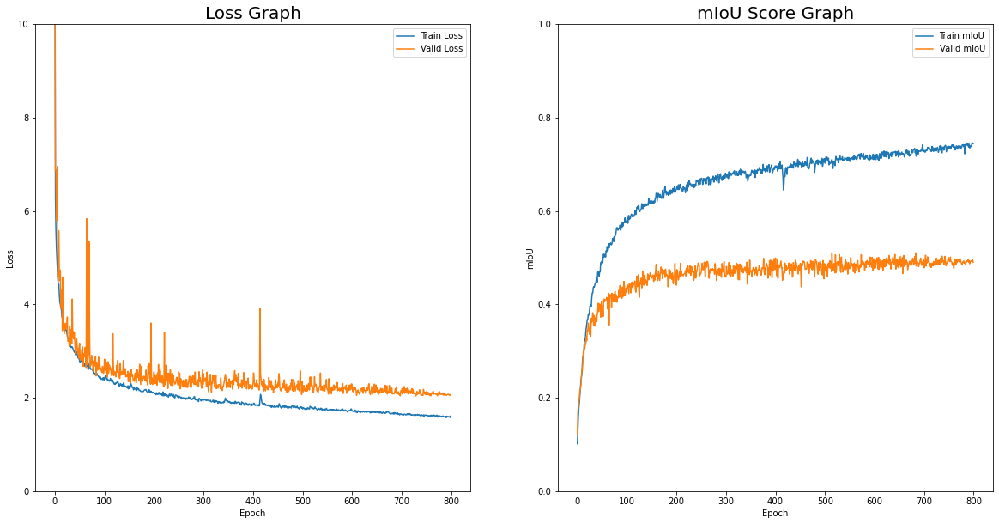

In [23]:
# check losses and miou scores graph
fig, ax = plt.subplots(1,2, figsize=(20,10))
ax[0].set_title('Loss Graph', fontsize=20)
ax[0].plot(np.arange(len(train_loss)), train_loss, label='Train Loss')
ax[0].plot(np.arange(len(valid_loss)), valid_loss, label='Valid Loss')
ax[0].set_ylim(0,10)
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')
ax[0].legend(loc='best')
ax[1].set_title('mIoU Score Graph', fontsize=20)
ax[1].plot(np.arange(len(train_miou)), train_miou, label='Train mIoU')
ax[1].plot(np.arange(len(valid_miou)), valid_miou, label='Valid mIoU')
ax[1].set_ylim(0,1)
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('mIoU')
ax[1].legend(loc='best')
fig.show()

# test model

In [24]:
model = BiSeNetV2(input_size=(height,width), bga_size=(height//8,width//8), phase='train').to(device)
model.load_state_dict(torch.load('./model/cp_checkpoint.pt'))

<All keys matched successfully>

In [25]:
# load test data
batch_size = 4

test_augment = A.Compose([
    A.Resize(height=height, width=width),
])

test_loader = DataLoader(
    CamVidDataset(transforms_=test_augment, subset='test'),
    batch_size=batch_size,
    shuffle=False,
    drop_last=True,
)

In [26]:
# test
test_images_list = []
test_labels_list = []
test_outputs_list = []

start = time.time()
model.eval()
with torch.no_grad():
    tbatch_loss, tbatch_miou = 0, 0
    for tbatch, (test_images, test_labels) in enumerate(test_loader):
        test_images = test_images.to(device)
        test_labels = test_labels.to(device)
        # predict
        test_outputs, _1, _2, _3, _4 = model(test_images)
        test_loss = loss_func(test_outputs, test_labels)
        test_miou = metric.mean_iou(test_outputs, test_labels)
        
        test_images_list.append(test_images.cpu())
        test_labels_list.append(test_labels.cpu())
        test_outputs_list.append(test_outputs.cpu())
        
        del test_images; del test_labels; del test_outputs
        del _1; del _2; del _3; del _4
        torch.cuda.empty_cache()
        
        tbatch_loss += test_loss.item()
        tbatch_miou += test_miou.item()
        
end = time.time()       
print(f'Test Loss: {tbatch_loss/(tbatch+1):.3f},'
      f'  Test mIoU: {tbatch_miou/(tbatch+1):.3f}'
      f'  Test time: {end-start:.3f}')

    
test_images = torch.cat(test_images_list, dim=0)
test_labels = torch.cat(test_labels_list, dim=0)
test_outputs = torch.cat(test_outputs_list, dim=0)

Test Loss: 0.660,  Test mIoU: 0.375


In [27]:
# 12 classes channels to 3 RGB channels
def map_class_to_rgb(p):
    return rgb_array[p[0]]

def mask2rgb(images):
    rgb_img_list = []
    for img in tqdm(images):
        img = img.detach().cpu().numpy()
        img = np.transpose(img, (1,2,0))
        img = np.argmax(img, axis=-1)
        rgb_img = np.apply_along_axis(map_class_to_rgb, -1, np.expand_dims(img, -1))
        rgb_img_list.append(rgb_img)
    return np.array(rgb_img_list)

In [28]:
test_result = mask2rgb(test_outputs)
test_mask = test_labels
test_labels = mask2rgb(test_labels)

  0%|          | 0/232 [00:00<?, ?it/s]

  0%|          | 0/232 [00:00<?, ?it/s]

In [29]:
# show test outputs with miou score
test_metric = Metrics(n_classes=num_classes, dim=0)

def cuda2numpy(tensors):
    tensors = tensors.detach().cpu().numpy()
    return np.transpose(tensors, (0,2,3,1))

def show_result(input_image, label_image, label_mask, pred_mask, pred_image, ncols):
    input_image = cuda2numpy(input_image)
    for i in range(ncols):
        # get miou score
        miou = test_metric.mean_iou(pred_mask[i], label_mask[i])
        # plot images
        fig, ax = plt.subplots(1,3, figsize=(15,5))
        fig.suptitle(f'mIoU score: {miou:.3f}', fontsize=25)
        ax[0].imshow(input_image[i])
        ax[0].axis('off')
        ax[0].set_title('Input Image')
        ax[1].imshow(label_image[i])
        ax[1].axis('off')
        ax[1].set_title(f'Ground Truth')
        ax[2].imshow(pred_image[i])
        ax[2].axis('off')
        ax[2].set_title(f'Predicted Image')
        fig.show()

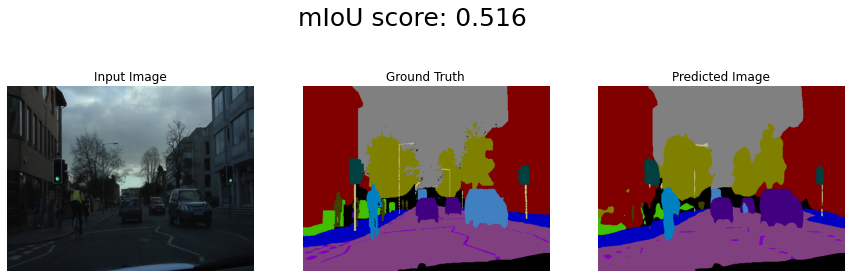

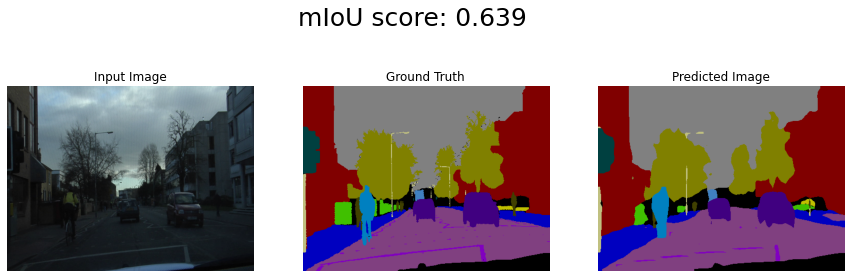

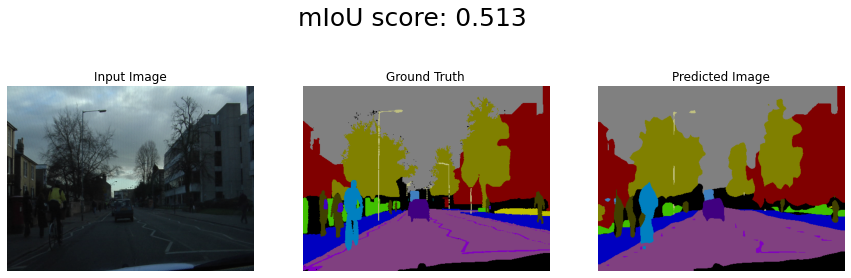

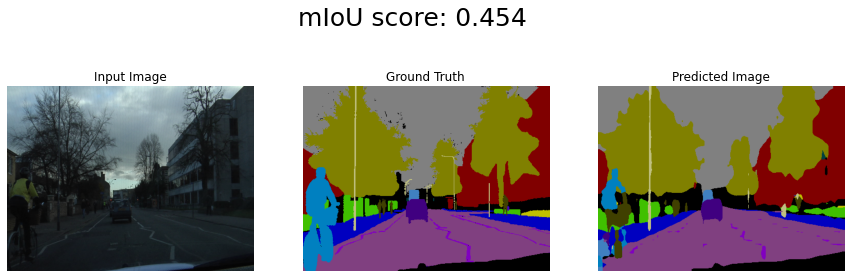

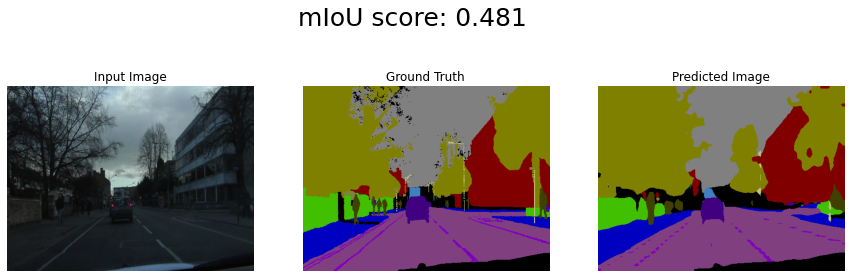

...

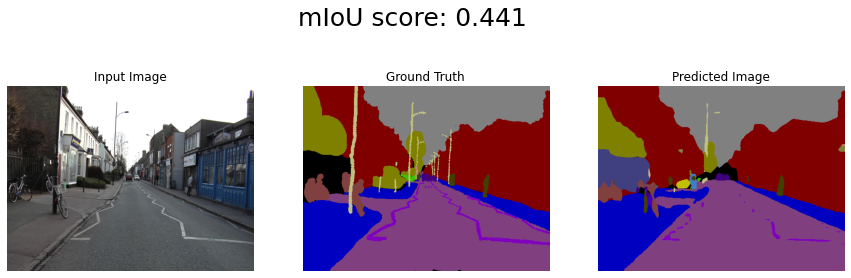

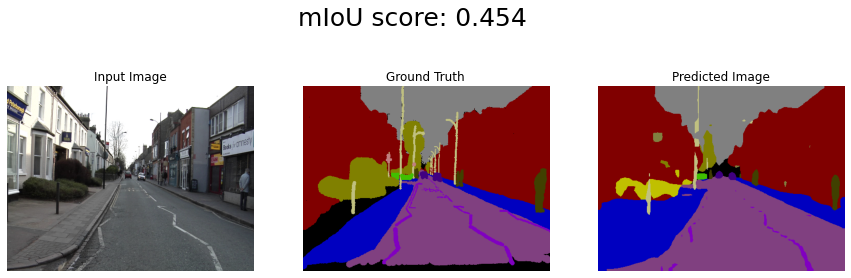

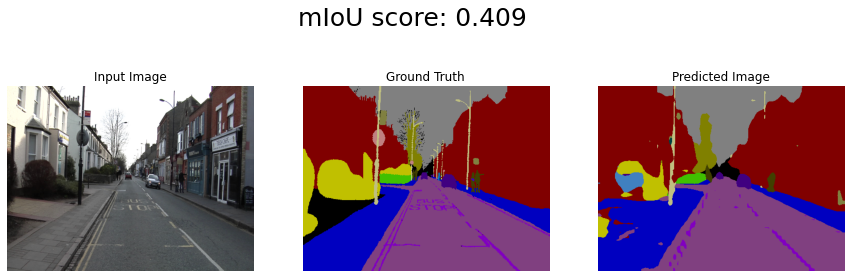

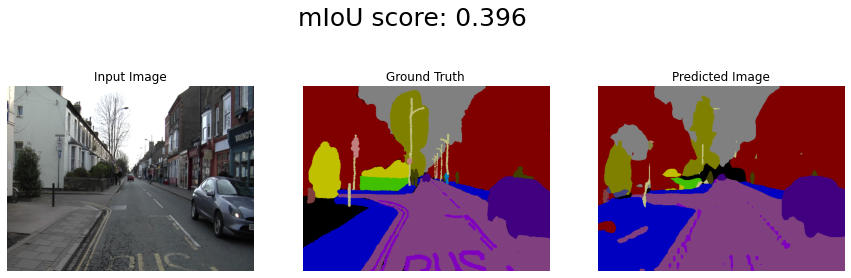

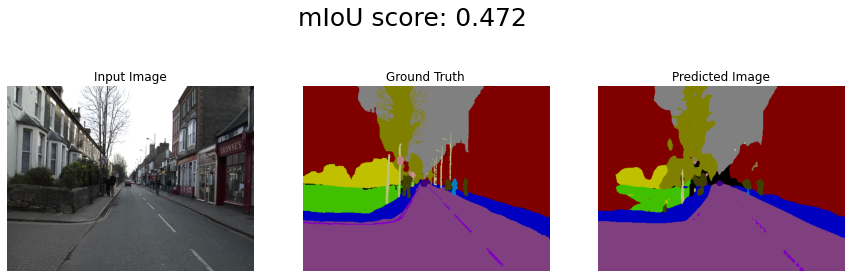

In [30]:
show_result(test_images, test_labels, test_mask, test_outputs, test_result, 100)

In [ ]:
# model이 train data에 대해 잘 훈련됐는지 확인
train_loader = DataLoader(
    CamVidDataset(transforms_=test_augment, subset='train'),
    batch_size=batch_size,
    shuffle=False, 
    drop_last=True
)

In [ ]:
# test
train_images_list = []
train_labels_list = []
train_outputs_list = []

model.eval()
with torch.no_grad():
    tbatch_loss, tbatch_miou = 0, 0
    for tbatch, (train_images, train_labels) in enumerate(train_loader):
        train_images = train_images.to(device)
        train_labels = train_labels.to(device)
        # predict
        train_outputs, _1, _2, _3, _4 = model(train_images)
        train_loss = loss_func(train_outputs, train_labels)
        train_miou = metric.mean_iou(train_outputs, train_labels)
        
        train_images_list.append(train_images)
        train_labels_list.append(train_labels)
        train_outputs_list.append(train_outputs)
        
        del train_images; del train_labels; del train_outputs
        del _1; del _2; del _3; del _4
        torch.cuda.empty_cache()
        
        tbatch_loss += train_loss.item()
        tbatch_miou += train_miou.item()
        
    print(f'Test Loss: {tbatch_loss/(tbatch+1):.3f},'
          f'  Test mIoU: {tbatch_miou/(tbatch+1):.3f}')
    
train_images = torch.cat(train_images_list, dim=0)
train_labels = torch.cat(train_labels_list, dim=0)
train_outputs = torch.cat(train_outputs_list, dim=0)

In [ ]:
show_result(train_images, train_labels, train_mask, train_outputs, train_result, batch_size)